# **Modules imports**

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# **Question 4**

In [3]:
def fct_to_minimize(X: np.array) -> np.array:
    """
    Function taken from Simone Scardapane's book
    "Alice's Adventures in a differentiable wonderland"
    f(X) = sin(x1) cos(x2) + sin(0.5*x1) cos(0.5*x2)
    Illustrated here for an array X of shape (n, 2).
    """
    x1, x2 = X[:, 0], X[:, 1]
    return np.sin(x1) * np.cos(x2) + np.sin(0.5 * x1) * np.cos(0.5 * x2)

In [4]:
def compute_grad(X: np.array) -> np.array:
    # grad = [df/dx1, df/dx2]
    x1, x2 = X[:, 0], X[:, 1]

    df_dx1 = np.cos(x1) * np.cos(x2) + 0.5 * np.cos(0.5 * x1) * np.cos(0.5 * x2)
    df_dx2 = -np.sin(x1) * np.sin(x2) - 0.5 * np.sin(0.5 * x1) * np.sin(0.5 * x2)
    return np.stack([df_dx1, df_dx2]).squeeze(-1)

In [5]:
def gradient_descent(X: np.array, lr: float, n_iter: int) -> np.array:
    """
    Perform n_iter steps of gradient descent with learning rate lr
    on the function fct_to_minimize starting at point X.
    """
    traj = []
    X = X.copy()
    # print(X.shape)
    for i in range(n_iter):
        grad = compute_grad(X)
        X -= lr * grad
        traj.append(X.copy())
    return X, np.array(traj)

In [6]:
def plot_function_plotly(traj: np.array = None):
    x1 = np.linspace(0, 10, 100)
    x2 = np.linspace(0, 10, 100)
    X1, X2 = np.meshgrid(x1, x2)
    X_flat = np.stack([X1.ravel(), X2.ravel()], axis=1)
    Z = fct_to_minimize(X_flat).reshape(100, 100)

    # Create figure
    fig = go.Figure()

    # Add 3D surface plot
    fig.add_trace(go.Surface(
        x=X1, y=X2, z=Z,
        colorscale="rdylbu_r",
        opacity=0.7
    ))

    # Plot trajectory if provided
    if traj is not None:
        traj = np.array(traj)
        traj = traj.squeeze(1)  # Remove singleton dimension
        x_traj, y_traj = traj[:, 0], traj[:, 1]
        z_traj = fct_to_minimize(traj)

        # Add trajectory as a line
        fig.add_trace(go.Scatter3d(
            x=x_traj, y=y_traj, z=z_traj,
            mode="lines+markers",
            marker=dict(size=3, color='black'),
            line=dict(color="black", width=3),
            name=""
        ))

        # Start and end points
        fig.add_trace(go.Scatter3d(
            x=[x_traj[0]], y=[y_traj[0]], z=[z_traj[0]],
            mode="markers",
            marker=dict(size=6, color='red'),
            name="Start"
        ))

        fig.add_trace(go.Scatter3d(
            x=[x_traj[-1]], y=[y_traj[-1]], z=[z_traj[-1]],
            mode="markers",
            marker=dict(size=6, color='green'),
            name="End"
        ))

    # Customize layout
    fig.update_layout(
        title="",
        scene=dict(
            xaxis_title="x1",
            yaxis_title="x2",
            zaxis_title="f(x1, x2)"
        ),
        showlegend=False
    )

    fig.show()

In [11]:
# How does selecting different starting points affect the trajectory?
# Play with this cell around - call it multiple times! We don't have here a deterministic output, so every time the starting point will differ!

for i in range(5):
    X_0 = np.random.uniform(0, 10, (1, 2))
    lr = 0.2
    n_iter = 100
    X_min, traj = gradient_descent(X_0, lr, n_iter)
    plot_function_plotly(traj=traj)

In [12]:
# How does the number of iterations affect the trajectory?
# Here we selected a nice starting point X_0 where the gradient descent is easy to track.

X_0 = np.array([[8, 7]]).astype(float)
lr = 0.2
n_iter = np.arange(1, 11, 1)

# we iterate from 1 to 10 steps in total
for n in n_iter:
    X_min, traj = gradient_descent(X_0, lr, n)
    plot_function_plotly(traj=traj)

In [14]:
# How does learning rate affect the trajectory?
X_0 = np.array([[8, 7]]).astype(float)
lr = np.array([0.002, 0.2, 1.0, 2.5])

for l in lr:
    n_iter = 20
    X_min, traj = gradient_descent(X_0, l, n_iter)
    plot_function_plotly(traj=traj)

# **Question 10**

In [15]:
def neuron_w(input_count):
  weights = np.zeros(input_count+1)
  for i in range(1, (input_count+1)):
    weights[i] = np.random.uniform(-1.0, 1.0)
  return weights

def show_learning():
  print('Current weights:')
  for i, w in enumerate(n_w):
    print('neuron ', i,
          ': w0 =', '%5.2f' % w[0],
          ', w1 =', '%5.2f' % w[1], ', w2 =',
          '%5.2f' % w[2])
  print('----------------')

def forward_pass(x):
  global n_y
  n_y[0] = np.tanh(np.dot(n_w[0], x)) # Neuron 0
  n_y[1] = np.tanh(np.dot(n_w[1], x)) # Neuron 1
  n2_inputs = np.array([1.0, n_y[0], n_y[1]]) # 1.0 is bias
  z2 = np.dot(n_w[2], n2_inputs)
  n_y[2] = 1.0 / (1.0 + np.exp(-z2))

def backward_pass(y_truth):
  global n_error
  error_prime = -(y_truth - n_y[2]) # Derivative of loss-func
  derivative = n_y[2] * (1.0 - n_y[2]) # Logistic derivative
  n_error[2] = error_prime * derivative
  derivative = 1.0 - n_y[0]**2 # tanh derivative
  n_error[0] = n_w[2][1] * n_error[2] * derivative
  derivative = 1.0 - n_y[1]**2 # tanh derivative
  n_error[1] = n_w[2][2] * n_error[2] * derivative

def adjust_weights(x):
  global n_w
  n_w[0] -= (x * LEARNING_RATE * n_error[0])
  n_w[1] -= (x * LEARNING_RATE * n_error[1])
  n2_inputs = np.array([1.0, n_y[0], n_y[1]]) # 1.0 is bias
  n_w[2] -= (n2_inputs * LEARNING_RATE * n_error[2])



In [20]:
np.random.seed(3) # To make repeatable
index_list = [0, 1, 2, 3] # Used to randomize order
LEARNING_RATE = 0.1

# Examples - input features
x_train = [np.array([1.0, -1.0, -1.0]),
           np.array([1.0, -1.0, 1.0]),
           np.array([1.0, 1.0, -1.0]),
           np.array([1.0, 1.0, 1.0])]

# Examples - output (ground truth)
y_train = [0.0, 1.0, 1.0, 0.0]

# Network initialization
n_w = [neuron_w(2), neuron_w(2), neuron_w(2)]
n_y = [0, 0, 0]
n_error = [0, 0, 0]

# Network training loop
all_correct = False
epoch_count = 0  # Initialize epoch counter
while not all_correct: # Train until converged
  all_correct = True
  epoch_count += 1  # Increment epoch counter
  print(f"Epoch: {epoch_count}")  # Print epoch number

  np.random.shuffle(index_list) # Randomize order
  for i in index_list: # Train on all examples
    forward_pass(x_train[i])
    backward_pass(y_train[i])
    adjust_weights(x_train[i])
    show_learning() # Show updated weights

  for i in range(len(x_train)): # Check if converged
    forward_pass(x_train[i])
    print('x1 =', '%4.1f' % x_train[i][1], ', x2 =',
          '%4.1f' % x_train[i][2], ', y =',
          '%.4f' % n_y[2])
    if (((y_train[i] < 0.5) and (n_y[2] >= 0.5))
    or ((y_train[i] >= 0.5) and (n_y[2] < 0.5))):
        all_correct = False

print(f"Total epochs: {epoch_count}")

Epoch: 1
Current weights:
neuron  0 : w0 =  0.01 , w1 =  0.11 , w2 =  0.41
neuron  1 : w0 =  0.01 , w1 = -0.41 , w2 =  0.01
neuron  2 : w0 =  0.01 , w1 =  0.78 , w2 =  0.79
----------------
Current weights:
neuron  0 : w0 =  0.00 , w1 =  0.12 , w2 =  0.41
neuron  1 : w0 =  0.00 , w1 = -0.40 , w2 =  0.02
neuron  2 : w0 =  0.00 , w1 =  0.79 , w2 =  0.78
----------------
Current weights:
neuron  0 : w0 = -0.00 , w1 =  0.11 , w2 =  0.41
neuron  1 : w0 = -0.01 , w1 = -0.41 , w2 =  0.01
neuron  2 : w0 = -0.01 , w1 =  0.78 , w2 =  0.79
----------------
Current weights:
neuron  0 : w0 =  0.00 , w1 =  0.11 , w2 =  0.41
neuron  1 : w0 = -0.00 , w1 = -0.42 , w2 =  0.02
neuron  2 : w0 = -0.00 , w1 =  0.78 , w2 =  0.79
----------------
x1 = -1.0 , x2 = -1.0 , y = 0.4811
x1 = -1.0 , x2 =  1.0 , y = 0.6347
x1 =  1.0 , x2 = -1.0 , y = 0.3645
x1 =  1.0 , x2 =  1.0 , y = 0.5179
Epoch: 2
Current weights:
neuron  0 : w0 =  0.01 , w1 =  0.10 , w2 =  0.42
neuron  1 : w0 =  0.00 , w1 = -0.42 , w2 =  0.02
neu

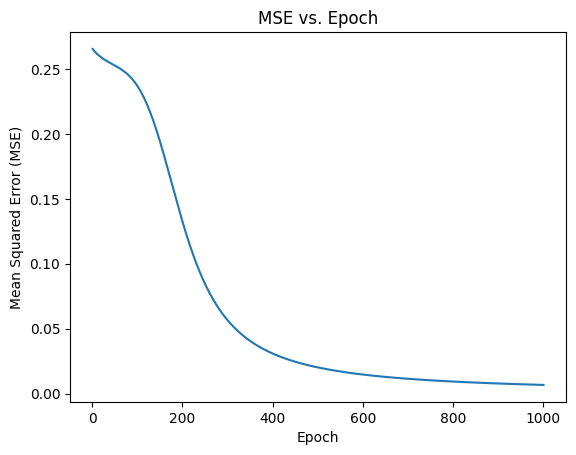

In [21]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(3)  # To make repeatable
index_list = [0, 1, 2, 3]  # Used to randomize order
LEARNING_RATE = 0.1

# Examples - input features
x_train = [np.array([1.0, -1.0, -1.0]),
           np.array([1.0, -1.0, 1.0]),
           np.array([1.0, 1.0, -1.0]),
           np.array([1.0, 1.0, 1.0])]

# Examples - output (ground truth)
y_train = [0.0, 1.0, 1.0, 0.0]

# Network initialization
n_w = [neuron_w(2), neuron_w(2), neuron_w(2)]
n_y = [0, 0, 0]
n_error = [0, 0, 0]

# Training loop with MSE calculation and plotting
mse_history = []
for epoch in range(1, 1001):  # Run for 1000 epochs
    total_mse = 0
    np.random.shuffle(index_list)  # Randomize order
    for i in index_list:  # Train on all examples
        forward_pass(x_train[i])
        backward_pass(y_train[i])
        adjust_weights(x_train[i])
        total_mse += (y_train[i] - n_y[2])**2  # Accumulate squared error

    mse_history.append(total_mse / len(x_train))  # Average MSE for the epoch

# Plotting the MSE history
plt.plot(range(1, 1001), mse_history)
plt.xlabel("Epoch")
plt.ylabel("Mean Squared Error (MSE)")
plt.title("MSE vs. Epoch")
plt.show()